In [6]:
!pip install kaggle -q

In [2]:
import os
import json
import zipfile

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from wordcloud import WordCloud
import re
import nltk

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize






In [6]:
from google.colab import files

uploaded = files.upload()

Saving spotify_millsongdata.csv to spotify_millsongdata (1).csv


In [3]:
df = pd.read_csv('/content/spotify_millsongdata.csv')

In [4]:
df.head()

,artist,song,link,text
0,ABBA,Ahe's My Kind Of Girl,/a/abba/ahes+my+kind+of+girl_20598417.html,"Look at her face, it's a wonderful face \r\nA..."
1,ABBA,"Andante, Andante",/a/abba/andante+andante_20002708.html,"Take it easy with me, please \r\nTouch me gen..."
2,ABBA,As Good As New,/a/abba/as+good+as+new_20003033.html,I'll never know why I had to go \r\nWhy I had...
3,ABBA,Bang,/a/abba/bang_20598415.html,Making somebody happy is a question of give an...
4,ABBA,Bang-A-Boomerang,/a/abba/bang+a+boomerang_20002668.html,Making somebody happy is a question of give an...


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57650 entries, 0 to 57649
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   artist  57650 non-null  object
 1   song    57650 non-null  object
 2   link    57650 non-null  object
 3   text    57650 non-null  object
dtypes: object(4)
memory usage: 1.8+ MB


In [6]:
df.nunique()

,0
artist,643
song,44824
link,57650
text,57494


In [7]:
df['artist'].value_counts().head()

,count
artist,
Donna Summer,191
Gordon Lightfoot,189
Bob Dylan,188
George Strait,188
Loretta Lynn,187


In [8]:
df[df['artist'] =='ABBA'].value_counts()

artist  song                       link                                             text                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
ABBA    Ahe's My Kind Of Girl      /a/abba/ahes+my+kind+of+girl_20598417.html       Look at her face, it's a wonderful face  \r\nAnd it means something special to me  \r\nLook at the way that she smiles when she sees me  \r\nHow lucky can one fellow be?  \r\n  \r\nShe's just my kind of girl, she makes me feel fine  \r\nWho could ever believe that she could be mine?  \r\nShe's just my kind of girl, without her I'm blue  \r\nAnd if she ever leaves me what could I do, what could I do?  \r\n  \r\nAnd when we go for a walk in the park  \r\nAnd she holds me and squeezes my hand  \r\nWe'll go on walking for hours and talking  \r\nAbout all the things that we plan  \r\n  \r\nShe's just my kind of girl, she makes me feel fine  \r\nWho could ever believe that she could be mine?  \r\nShe's just my kind of girl, without her I'm blue  \r\nAnd if she ever leaves me what could I do, what could I do?\r\n\r\n                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       1
        Andante, Andante           /a/abba/andante+andante_20002708.html            Take it easy with me, please  \r\nTouch me gently like a summer evening breeze  \r\nTake your time, make it slow  \r\nAndante, Andante  \r\nJust let the feeling grow  \r\n  \r\nMake your fingers soft and light  \r\nLet your body be the v

In [9]:
top_artist = df['artist'].value_counts().head(10)
top_artist

,count
artist,
Donna Summer,191
Gordon Lightfoot,189
Bob Dylan,188
George Strait,188
Loretta Lynn,187
Alabama,187
Cher,187
Reba Mcentire,187
Chaka Khan,186


In [10]:
df = df.sample(10000)

df = df.drop('link', axis=1).reset_index(drop=True)

In [11]:
df.shape

(10000, 3)

# WordCloud to visualize the most common words in the lyrics.

In [12]:
all_lyrics = " ".join(df['text'].dropna())
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(all_lyrics)

In [13]:
all_lyrics

'She pulls the shade  \r\nIt\'s just another sunny Sunday  \r\nShe dodges the light like Blanche DuBois  \r\nBright colors fade away on such a sunny Sunday,  \r\nShe waits for the night to fall  \r\nThen she points a pistol through the door  \r\nAnd she aims at the streetlight  \r\nWhile the freeway hisses  \r\nDogs bark as the gun falls to the floor  \r\nThe streetlight\'s still burning,  \r\nShe always misses  \r\nBut the day she hits  \r\nThat\'s the day she\'ll leave  \r\nThat one little victory, that\'s all she needs!  \r\nShe pulls the shade,  \r\nIt\'s just another sunny Monday  \r\nShe waits for the night to fall\r\n\r\n I look around, I see a million different faces  \r\nBut no one\'s lookin\' in my eyes  \r\nIt takes a minute when I\'m in these different places  \r\nTo realize  \r\nAll we need is love in this life, it\'s true  \r\nAll I need is the love I get from you  \r\nAnd I wanna scream it out  \r\nIf you hear what I\'m sayin\'  \r\nPut your hands up  \r\nIf you\'re feel

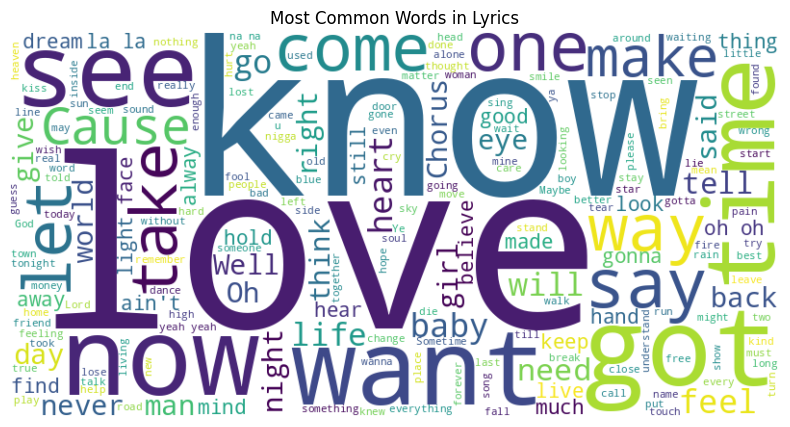

In [14]:
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Most Common Words in Lyrics")
plt.show()

# Data Preprocessing

In [15]:
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [16]:
stop_words = set(stopwords.words('english'))

In [17]:
def preprocess_text(text):
    # Remove special characters and numbers
    text = re.sub(r"[^a-zA-Z\s]", "", text)
    # Convert to lowercase
    text = text.lower()
    # Tokenize and remove stopwords
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word not in stop_words]
    return " ".join(tokens)

### Apply preprocessing to lyrics

In [18]:
df['cleaned_text'] = df['text'].apply(preprocess_text)

In [19]:
df.sample(5)

,artist,song,text,cleaned_text
1338,David Bowie,Little Bombadier,War made him a soldier \r\nLittle Frankie Mea...,war made soldier little frankie mear peace lef...
1487,Lana Del Rey,Delicious,"I don't know why you're, \r\nLooking at those...",dont know youre looking girls im delicious the...
1631,Indigo Girls,Burn All The Letters,I am sorry that I set my sights \r\nOn the th...,sorry set sights things read something meant h...
396,Warren Zevon,Detox Mansion,"Well, I'm gone to \r\nWay down on Last Breath...",well im gone way last breath farm ive rakin le...
9902,Josh Groban,Smile,Smile though your heart is aching \r\nSmile e...,smile though heart aching smile even though br...


# Vectorization with TF-IDF

In [20]:
tfidf_vectorizer = TfidfVectorizer(max_features=5000)
tfidf_matrix = tfidf_vectorizer.fit_transform(df['cleaned_text'])

#### Compute Cosine Similarity


In [21]:
cosine_sim = cosine_similarity(tfidf_matrix, tfidf_matrix)

### Recommendation Function

In [22]:
def recommend_songs(song_name, cosine_sim=cosine_sim, df=df, top_n=5):
    # Find the index of the song
    idx = df[df['song'].str.lower() == song_name.lower()].index
    if len(idx) == 0:
        return "Song not found in the dataset!"   # can be reworked to compare for songs not present in the dataset
    idx = idx[0]

    # Get similarity scores
    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:top_n+1]

    # Get song indices
    song_indices = [i[0] for i in sim_scores]

    # Return top n similar songs
    return df[['artist', 'song']].iloc[song_indices]


In [27]:
df["song"][3]

'Go It Alone'

In [24]:
print("\nRecommendations for the song 'Blinded By Rainbows':")
recommendations = recommend_songs("For The First Time") # df["song"][2]
print(recommendations)


Recommendations for the song 'Blinded By Rainbows':
Song not found in the dataset!
